In [1]:
# 1- Call GoogleNews model
import pickle
with open(f'GoogleNews.pkl', 'rb') as f:
        model = pickle.load(f)

In [164]:
from __future__ import unicode_literals
from gensim.summarization import keywords
import pandas as pd

import nltk
import string
import matplotlib.pyplot as plt
from nltk.stem.porter import PorterStemmer
import unicodedata
import math
import bytes
import os
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords
import re
import seaborn as sns
from collections import Counter

import gensim
from gensim.models import Word2Vec
import logging


from sklearn.metrics.pairwise import cosine_distances
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

import sys
from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
from pdfminer.pdfpage import PDFPage
from pdfminer.converter import XMLConverter, HTMLConverter, TextConverter
from pdfminer.layout import LAParams

from io import StringIO

#import Text_preprocessing
#import Vectorizing_Test_Data
#import Resume_converting
#import Plot_graphs

#---------------------------------
#Set up directory
os.chdir(r"C:\Users\khans\Insight\My code")

#---------------------------------
# Parse input resume file
def pdfparser(data):

    fp = open(data, 'rb')
    rsrcmgr = PDFResourceManager()
    retstr = StringIO()
    codec = 'utf-8'
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, laparams=laparams)
    # removed from the line above: , codec=codec
    # Create a PDF interpreter object.
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    # Process each page contained in the document.

    for page in PDFPage.get_pages(fp):
        interpreter.process_page(page)
        data =  retstr.getvalue()

    return data

#---------------------------------
# Convert resume into text file and save

def resumeConvertor(resumename):
    with open('resumeconverted.txt','w') as f:
        f.write(pdfparser(str(resumename) + ".pdf"))
    
    with open('resumeconverted.txt','r') as f:
        resume = f.read()
    
    return resume
#---------------------------------
# Text preprocessing

def preprocess(text):
    """ preprocess text: remove special characters, remove digits, tokenize,
    lowercase, remove stopwords, lemmatize
    """
    # preparing for text preprocessing: tokenizer, stopwords, and lemmatizer
    tokenizer = RegexpTokenizer(r'\w+')
    #stopwords_en = set(stopwords.words('english'))
    stopwords_en = nltk.corpus.stopwords.words('english')
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('[^a-zA-Z]', ' ', text )
    text = re.sub(r'\s+', ' ', text)
    tokens = tokenizer.tokenize(text)
    tokens = [token.lower() for token in tokens if len(token)>2]
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stopwords_en]
    return ' '.join(tokens)

def table_preprocess(filename):
    
    df = pd.read_csv(filename)
    df.rename(columns = {'Unnamed: 0':'Job No.'}, inplace = True) 
    
    # preprocess job title and description
    for col in ['position', 'Job Description']:
        df[col] = df[col].astype(str)
        df[col+'_processed'] = df[col].apply(preprocess)


    # have a column for both title and descritpion
    cols = ['position_processed', 'Job Description_processed']
    df['title_and_desc'] = df[cols].apply(lambda x: ' '.join(x), axis=1)
    
    
    # Create a "csv" file using the job title, description, and company (with preprocessed text)
    # Choose final columns needed for analysis and save the scv file
    df = df[['position_processed', 'Job Description_processed','Job Description','company', "position"]]
    df.to_csv("clean_data.csv")
    
    return df
#---------------------------------
# Vectorize the input resume


#------------        
# 2- Vectorize the resume

def Word2Vec_Vectorize(resumename):
    
    #resumename = str(resumename) +".pdf"
    #resume = resumeConvertor(resumename)

    j = resume
    
    stopwords = nltk.corpus.stopwords.words('english')

    imp = ['java']
    vec = []

    
    x = j.translate(str.maketrans('', '', string.punctuation))
    y = x.translate(str.maketrans('', '', string.digits))
    #print(y)
    jd_vector = []
    i = 0

    for word in y.split():
        if word.lower() not in stopwords and len(word)>2 and word not in imp:
            try:
                x = model[word]
                idx = myvec.get_features().index(word)
                z = myvec.get_matrix()[i][idx]
                lst = [a * z for a in x]
                jd_vector.append(lst)
            except:
                continue

        else:
            try:
                x = model[word]
                lst = [a * 2 for a in x]
                jd_vector.append(lst)
            except:
                continue
        #jd_vector = normalize(jd_vector)
    #i+=1

    vec.append(jd_vector)
        #print(jd_vector)
        
    #---------------------------    
    
    mean_vec = []
    for j in vec:
        mean = []
        for i in range(300):
            accum =0
            for word in j:
                accum += word[i]
            mean.append(1.0*accum/len(word))
        mean_vec.append(mean)
    data = mean_vec
    
    data_df = pd.DataFrame(data)
    #data_df.to_csv("Vec "+str(resumename)+ '.csv')
    
    return data


#---------------------------------
# Plot graphs
def plot_mds(mean_vec):   
    from sklearn.manifold import MDS
    data = mean_vec
    mds = MDS(n_components=2, random_state=1)
    pos = mds.fit_transform(data)
    xs,ys = pos[:,0], pos[:,1]
    for x, y in zip(xs, ys):
        plt.scatter(x, y)
    #    plt.text(x, y, name)
    #pos2 = mds.fit_transform(model.infer_vector(resume))
    #xs2,ys2 = pos2[:,0], pos2[:,1]
    plt.scatter(xs[-1], ys[-1], c='Red', marker='+')
    plt.text(xs[-1], ys[-1],'resume')
    plt.suptitle('MDS')
    plt.grid()
    plt.savefig('distance_MDS_improved.png')
    plt.show()

def plot_pca(mean_vec):
    from sklearn.decomposition import PCA
    #data = mean_vec
    pca = PCA(n_components=2) #, whiten=True
    X = pca.fit_transform(mean_vec)
    xs,ys =X[:,0], X[:,1]
    plt.scatter(X[:,0], X[:,1])
    plt.scatter(xs[-1], ys[-1], c='Red', marker='+')
    plt.text(xs[-1], ys[-1],'resume')
    plt.grid()
    plt.suptitle('PCA')
    plt.savefig('distance_PCA_improved.png')
    plt.show()

#---------------------------------
# Calculate similarity

def Similarity(filename, resumename):
    
    

    df_main = pd.read_csv(str(filename)+".csv")
    df_main = df_main.drop(["Unnamed: 0"], axis = 1)
    array_main = df_main.values
#-------------------------
    dataset = "Data_Demo.csv"
    df = table_preprocess(dataset)
    # Create a list of job titles, descriptions, and companies
    
    jd = df['Job Description'].tolist()
    companies = df['company'].tolist()
    positions = df['position'].tolist()

    #-------------------------
    # Resume vector
    
    data = Word2Vec_Vectorize(str(resumename))
    data_array = np.array(data)
    data_array_reshaped = data_array.reshape(1,-1)
    
    #-------------------------

    cos_dist =[]

    for vec in array_main:
        vec = np.array(vec)
        vec = vec.reshape(1,-1)
        cos_dist.append(float(cosine_distances(vec,data_array_reshaped)))
        
     #-----------------------
    
    
    ps = PorterStemmer()
    key_list =[]

    for j in jd:
        key = ''
        w = set()
        for word in keywords(j).split('\n'):
            w.add(ps.stem(word))
        for x in w:
            key += '{} '.format(x)
        key_list.append(key)
    
    summary = pd.DataFrame({
        'Company': companies,
        'Postition': positions,
        'Cosine Distances': cos_dist,
        'Keywords': key_list,
    'Job Description': jd
    })

    z =summary.sort_values('Cosine Distances', ascending=False)
    z.to_csv('Summary' + str(filename)+ '.csv',encoding="utf-8")
    
    #--------------------------------
    # Plot graphs
    array_main = df_main.values
    array_list = array_main.tolist()
    
    data_list = data[0]
    array_list.append(data_list)
    
    #mean_vec = array_list
    plot_pca(array_list)
    
    return z.head()   
    
   
    

#---------------------------------


#---------------------------------


#---------------------------------


#---------------------------------


#---------------------------------

#---------------------------------



In [125]:
import numpy as np

def normalize(word_vec):
    norm=np.linalg.norm(word_vec)
    if norm == 0: 
           return word_vec
    return word_vec/norm

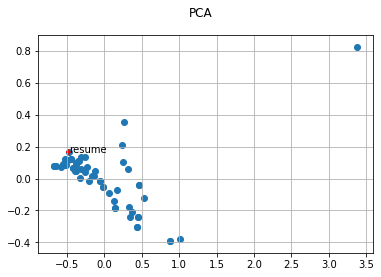

,Company,Postition,Cosine Distances,Keywords,Job Description
55,Raytheon,Statistician / Data Scientist,0.535784,opportun action veteran,[<p>Raytheon is an Equal Opportunity/Affirmati...
54,Raytheon,Statistician/Data Scientist,0.535784,opportun action veteran,[<p>Raytheon is an Equal Opportunity/Affirmati...
0,IBM,Information Technology Intern,0.515986,chief skill internship mobil,The IBM Chief Information Officer(CIO) organi...
1,Mary Kay,NSD Services Intern Undergrad,0.503288,people environ social commun forc corpor stage...,Intern will learn the inner workings of both ...
3,Deloitte,"Summer Associate - Strategy & Operations, MBA ...",0.481013,career frequent chanc associ client senior maj...,Deloitte Consulting LLP is one of the worldâ€...


In [4]:
resumename = "Sherry Khansari"
filename = "Vec Data_Demo.csv"
Similarity(filename, resumename)

### Validation - Read the resume dataset

In [165]:
res_data = pd.read_csv("resume_dataset.csv")

res_data.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [166]:
len(res_data)

169

In [167]:
res_vec = []
for i in range(len(res_data)):
    resume = res_data.iloc[i,1]
    
    vec = Word2Vec_Vectorize(resume)
    res_vec.append(vec)
    

In [169]:

res_vec = pd.DataFrame(res_vec)
res_vec.to_csv("resume_vectors.csv",encoding="utf-8", header = False)
    


In [47]:
filename = "Vec Data_Demo.csv"
df_main = pd.read_csv(filename)
df_main = df_main.drop(["Unnamed: 0"], axis = 1)
array_main = df_main.values


In [48]:
len(array_main)

56

In [49]:
dataset = "Data_Demo.csv"
df = table_preprocess(dataset)
    # Create a list of job titles, descriptions, and companies
    
jd = df['Job Description'].tolist()
companies = df['company'].tolist()
positions = df['position'].tolist()

' The IBM Chief Information Officer(CIO) organization is looking for highly skilled and motivated interns to work in one of our key locations. The internship would require skills in Agile ways of working, mobile, social, analytics, data science, risk and more. Previous internship experience is preferred.'

In [65]:
for j in range(len(res_vec)):
    resume_vec = res_vec.iloc[j,0]
    resume_vec = np.array(resume_vec)
    resume_vec = resume_vec.reshape(1,-1)
    
    cos_dist =[]
    
    for i in range(len(array_main)):

        vec_main =  array_main[i]
        vec_main = np.array(vec_main)
        vec_main = vec_main.reshape(1,-1)
        
    
        cos_dist.append(float(cosine_distances(vec_main,resume_vec)))
        
    summary = pd.DataFrame({
    "Category": res_data.iloc[j,0],
    "Resume": res_data.iloc[j,1],
    'Company': companies,
    'Postition': positions,
    'Cosine Distances': cos_dist,
    #'Keywords': key_list,
    'Job Description': jd
            })
        
        
    z =summary.sort_values('Cosine Distances', ascending=False)
    z.to_csv('Summary_per_job ' + str(j)+ '.csv',encoding="utf-8")    

#### Load Indeed scrapped data with the same types as resume

In [97]:
os.chdir(r"C:\Users\khans\Insight\My code")

In [82]:
scrapped_df= pd.read_csv("Indeed_scrapped_validation.csv")
scrapped_df.drop(["Unnamed: 0", "type", "Location", "Salary"], inplace = True, axis = 1)
scrapped_df.rename(columns = {"Title": "position", "Company": "company", "Synopsis": "Job Description"}, inplace = True)
scrapped_df.to_csv("organized_scrapped.csv", encoding="utf-8")

In [79]:
len(scrapped_df)

842

In [81]:
scrapped_df.Type.unique()

array(['Data Science', 'HR', 'Advocate', 'Arts', 'Web Designing',
       'Mechanical Engineer', 'Sales', 'Health and fitness',
       'Civil Engineer', 'Java Developer', 'Business Analyst',
       'SAP Developer', 'Automation Testing', 'Electrical Engineering',
       'Operations Manager', 'Python Developer', 'DevOps Engineer',
       'Network Security Engineer', 'PMO', 'Database', 'Hadoop',
       'ETL Developer', 'DotNet Developer', 'Blockchain', 'Testing'],
      dtype=object)

In [94]:


# Text preprocessing

def preprocess(text):
    """ preprocess text: remove special characters, remove digits, tokenize,
    lowercase, remove stopwords, lemmatize
    """
    # preparing for text preprocessing: tokenizer, stopwords, and lemmatizer
    tokenizer = RegexpTokenizer(r'\w+')
    #stopwords_en = set(stopwords.words('english'))
    stopwords_en = nltk.corpus.stopwords.words('english')
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('[^a-zA-Z]', ' ', text )
    text = re.sub(r'\s+', ' ', text)
    tokens = tokenizer.tokenize(text)
    tokens = [token.lower() for token in tokens if len(token)>2]
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stopwords_en]
    return ' '.join(tokens)

def table_preprocess(filename):
    
    df = pd.read_csv(filename)
    df.rename(columns = {'Unnamed: 0':'Job No.'}, inplace = True) 
    
    # preprocess job title and description
    for col in ['position', 'Job Description']:
        df[col] = df[col].astype(str)
        df[col+'_processed'] = df[col].apply(preprocess)


    # have a column for both title and descritpion
    cols = ['position_processed', 'Job Description_processed']
    df['title_and_desc'] = df[cols].apply(lambda x: ' '.join(x), axis=1)
    
    
    # Create a "csv" file using the job title, description, and company (with preprocessed text)
    # Choose final columns needed for analysis and save the scv file
    df = df[['position_processed', 'Job Description_processed','Job Description','company', "position", "Type"]]
    df.to_csv("clean_data.csv")
    
    return df




,position_processed,Job Description_processed,Job Description,company,position,Type
0,lead data scientist,data analytics computer science related quanti...,"Data Analytics, Computer Science or related q...",Humana,Lead Data Scientist,Data Science
1,analyst data science,work massive amount data build sophisticated m...,Work with massive amounts of data to build so...,Liberty Mutual Insurance,"Analyst I/II, Data Science",Data Science
2,senior data scientist analytics platform service,master degree quantitative field statistic bus...,Master degree in a quantitative field (Statis...,Humana,"Senior Data Scientist, Analytics Platform as ...",Data Science
3,business intelligence analyst,requirement requires bachelor degree computer ...,Requirements: Requires a Bachelor’s degree in...,Wayfair,Business Intelligence Analyst 2,Data Science
4,data science project manager,scale data science impact act champion data sc...,To scale our data science impact.Act as a cha...,MassMutual,Data Science Project Manager,Data Science
...,...,...,...,...,...,...
837,api tester,testing tool soap postman api web service test...,Testing tools eg: Soap UI Postman.API web ser...,TOPSYSIT,API Tester,Testing
838,entry level business analyst,execute maintain standard corporate practice t...,Execute and maintain standard corporate pract...,BACloudSystems,Entry Level Business Analyst,Testing
839,public aid eligibility assistant opt,non state applicant general public written exa...,NON-STATE APPLICANTS/GENERAL PUBLIC: If a wri...,State of Illinois,Public Aid Eligibility Assistant - Opt SS,Testing
840,quality inspector,assist quality control manager development imp...,Assist the Quality Control Manager in the dev...,Prikos and Becker,Quality Inspector,Testing


In [123]:
# Vectorize the dataset and save the csv file
# Did and saved as Vec Organized_scrapped.csv"

# Set up the new dataset using scrapped data
dataset = "organized_scrapped.csv"
df = table_preprocess(dataset)

# Create a list of job titles, descriptions, and companies
    
jd = df['Job Description'].tolist()
companies = df['company'].tolist()
positions = df['position'].tolist()
types = df["Type"].tolist()

filename = "Vec organized_scrapped.csv"
df_main = pd.read_csv(filename)
df_main = df_main.drop(["Unnamed: 0"], axis = 1)
array_main = df_main.values

for j in range(len(res_vec)):
    resume_vec = res_vec.iloc[j,0]
    resume_vec = np.array(resume_vec)
    resume_vec = resume_vec.reshape(1,-1)
    
    cos_dist =[]
    
    for i in range(len(array_main)):

        vec_main =  array_main[i]
        vec_main = np.array(vec_main)
        vec_main = vec_main.reshape(1,-1)
        
    
        cos_dist.append(float(cosine_distances(vec_main,resume_vec)))
        
    summary = pd.DataFrame({
    "Category": res_data.iloc[j,0],
    "Resume": res_data.iloc[j,1],
    "type_scrapped" : types,
    'Company': companies,
    'Postition': positions,
    'Cosine Distances': cos_dist,
    #'Keywords': key_list,
    'Job Description': jd
            })
        
        
    z =summary.sort_values('Cosine Distances', ascending=False)
    z.to_csv('Resume_jobtitle ' + str(j)+ '.csv',encoding="utf-8")    


In [124]:
comparison = pd.DataFrame(columns = ['Category','Resume', 'type_scrapped', 'Company','Postition', 
                                     'Cosine Distances', 'Job Description'])

for j in range(len(res_vec)):
    df = pd.read_csv('Resume_jobtitle ' + str(j)+ '.csv')
    df.drop("Unnamed: 0", axis = 1, inplace = True)
    df_top = df.iloc[:6, :]
    comparison = pd.concat([comparison,df_top], axis = 0)

comparison.to_csv("Res_Title_df.csv", encoding = "utf-8")


In [105]:
comparison

,Category,Resume,type_scrapped,Company,Postition,Cosine Distances,Job Description


#### Let's look at the titles from jobs and how they match with resumes and job types

##### Let's take a look at scrapped job titles and resume job titles

In [131]:
res_data.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


'Data Science'

In [160]:
# 1 - Vectorize titles from resume dataset
resTitle_vec = []
for i in range(len(res_data)):
    title = res_data.iloc[i,0]
    
    vec = Word2Vec_Vectorize(title)
    resTitle_vec.append(vec)

In [161]:
# 2 - Vectorize titles from scrapped jobs
filename = "organized_scrapped.csv"
df = pd.read_csv(filename)
df.drop("Unnamed: 0", axis = 1, inplace = True)
df.head()


,position,company,Job Description,Type
0,Lead Data Scientist,Humana,"Data Analytics, Computer Science or related q...",Data Science
1,"Analyst I/II, Data Science",Liberty Mutual Insurance,Work with massive amounts of data to build so...,Data Science
2,"Senior Data Scientist, Analytics Platform as ...",Humana,Master degree in a quantitative field (Statis...,Data Science
3,Business Intelligence Analyst 2,Wayfair,Requirements: Requires a Bachelor’s degree in...,Data Science
4,Data Science Project Manager,MassMutual,To scale our data science impact.Act as a cha...,Data Science


In [162]:
position_vec = []
for i in range(len(df)):
    position = df.iloc[i,0]
    
    vec = Word2Vec_Vectorize(position)
    position_vec.append(vec)
    


In [163]:
# Vectorize the dataset and save the csv file
# Did and saved as Vec Organized_scrapped.csv"

# Set up the new dataset using scrapped data
dataset = "organized_scrapped.csv"
df = table_preprocess(dataset)

# Create a list of job titles, descriptions, and companies
    
jd = df['Job Description'].tolist()
companies = df['company'].tolist()
positions = df['position'].tolist()
types = df["Type"].tolist()

filename = "Vec organized_scrapped.csv"
df_main = pd.read_csv(filename)
df_main = df_main.drop(["Unnamed: 0"], axis = 1)
array_main = df_main.values

for j in range(len(resTitle_vec)):
    resume_vec = resTitle_vec[j]
    resume_vec = np.array(resume_vec)
    resume_vec = resume_vec.reshape(1,-1)
    
    cos_dist =[]
    
    for i in range(len(position_vec)):

        vec_main =  position_vec[i]
        vec_main = np.array(vec_main)
        vec_main = vec_main.reshape(1,-1)
        
    
        cos_dist.append(float(cosine_distances(vec_main,resume_vec)))
        
    summary = pd.DataFrame({
    "Category": res_data.iloc[j,0],
    "Resume": res_data.iloc[j,1],
    "type_scrapped" : types,
    'Company': companies,
    'Postition': positions,
    'Cosine Distances': cos_dist,
    #'Keywords': key_list,
    'Job Description': jd
            })
        
        
    z =summary.sort_values('Cosine Distances', ascending=False)
    z.to_csv('Resumetile_jobtitle ' + str(j)+ '.csv',encoding="utf-8")    

#### Let's merge resume content and title and then compare with the job title

In [172]:

# Text preprocessing

def preprocess(text):
    """ preprocess text: remove special characters, remove digits, tokenize,
    lowercase, remove stopwords, lemmatize
    """
    # preparing for text preprocessing: tokenizer, stopwords, and lemmatizer
    tokenizer = RegexpTokenizer(r'\w+')
    #stopwords_en = set(stopwords.words('english'))
    stopwords_en = nltk.corpus.stopwords.words('english')
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('[^a-zA-Z]', ' ', text )
    text = re.sub(r'\s+', ' ', text)
    tokens = tokenizer.tokenize(text)
    tokens = [token.lower() for token in tokens if len(token)>2]
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stopwords_en]
    return ' '.join(tokens)

def table_preprocess(filename):
    
    df = pd.read_csv(filename)
   
    
    # preprocess job title and description
    for col in ['Category', 'Resume']:
        df[col] = df[col].astype(str)
        df[col+'_processed'] = df[col].apply(preprocess)


    # have a column for both title and descritpion
    cols = ['Category_processed', 'Resume_processed']
    df['title_and_desc'] = df[cols].apply(lambda x: ' '.join(x), axis=1)
    
    
    # Create a "csv" file using the job title, description, and company (with preprocessed text)
    # Choose final columns needed for analysis and save the scv file
    df = df[['Category_processed', 'Resume_processed','Category','Resume', 'title_and_desc']]
    df.to_csv("cleanResume_data.csv")
    
    return df



In [173]:
filename = "resume_dataset.csv"
resume_df = table_preprocess(filename)

In [178]:
# Vectorize Title and Resume column
resTitleDesc_vec = []
for i in range(len(resume_df)):
    title_desc = resume_df.iloc[i,4]
    
    vec = Word2Vec_Vectorize(title_desc)
    resTitleDesc_vec.append(vec)

In [182]:
dataset = "organized_scrapped.csv"


def table_preprocess(filename):
    
    df = pd.read_csv(filename)
   
    
    # preprocess job title and description
    for col in ['position', 'Job Description']:
        df[col] = df[col].astype(str)
        df[col+'_processed'] = df[col].apply(preprocess)


    # have a column for both title and descritpion
    cols = ['position_processed', 'Job Description_processed']
    df['title_and_desc'] = df[cols].apply(lambda x: ' '.join(x), axis=1)
    
    
    # Create a "csv" file using the job title, description, and company (with preprocessed text)
    # Choose final columns needed for analysis and save the scv file
    df = df[['position_processed', 'Job Description_processed','title_and_desc',"Type", "position", "Job Description"]]
    df.to_csv("cleanResume_data.csv")
    
    return df


scrapped_df = table_preprocess(dataset)

In [187]:
scrapped_df.head()

,position_processed,Job Description_processed,title_and_desc,Type,position,Job Description
0,lead data scientist,data analytics computer science related quanti...,lead data scientist data analytics computer sc...,Data Science,Lead Data Scientist,"Data Analytics, Computer Science or related q..."
1,analyst data science,work massive amount data build sophisticated m...,analyst data science work massive amount data ...,Data Science,"Analyst I/II, Data Science",Work with massive amounts of data to build so...
2,senior data scientist analytics platform service,master degree quantitative field statistic bus...,senior data scientist analytics platform servi...,Data Science,"Senior Data Scientist, Analytics Platform as ...",Master degree in a quantitative field (Statis...
3,business intelligence analyst,requirement requires bachelor degree computer ...,business intelligence analyst requirement requ...,Data Science,Business Intelligence Analyst 2,Requirements: Requires a Bachelor’s degree in...
4,data science project manager,scale data science impact act champion data sc...,data science project manager scale data scienc...,Data Science,Data Science Project Manager,To scale our data science impact.Act as a cha...


In [185]:
# Vectorize Title and Description column
TitleDesc_vec = []
for i in range(len(scrapped_df)):
    title_desc = scrapped_df.iloc[i,2]
    
    vec = Word2Vec_Vectorize(title_desc)
    TitleDesc_vec.append(vec)

In [189]:
# Apply cosine similarity

jd = df['Job Description'].tolist()
companies = df['company'].tolist()
positions = df['position'].tolist()
types = df["Type"].tolist()



for j in range(len(resTitleDesc_vec)):
    resume_vec = resTitleDesc_vec[j]
    resume_vec = np.array(resume_vec)
    resume_vec = resume_vec.reshape(1,-1)
    
    cos_dist =[]
    
    for i in range(len(TitleDesc_vec)):

        vec_main =  TitleDesc_vec[i]
        vec_main = np.array(vec_main)
        vec_main = vec_main.reshape(1,-1)
        
    
        cos_dist.append(float(cosine_distances(vec_main,resume_vec)))
        
        
    summary = pd.DataFrame({
    "Category": resume_df.iloc[j,0],
    "Resume": resume_df.iloc[j,1],
    "type_scrapped" : types,
    'Company': companies,
    'Postition': positions,
    'Cosine Distances': cos_dist,
    #'Keywords': key_list,
    'Job Description': jd
            })
        
        
    z =summary.sort_values('Cosine Distances', ascending=False)
    z.to_csv('restitle_postitle ' + str(j)+ '.csv',encoding="utf-8")    

[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

[0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

KeyboardInterrupt: 

In [195]:
resume_vec = resTitleDesc_vec[1]
#resume_vec = np.array(resume_vec)
#resume_vec = resume_vec.reshape(1,-1)


vec_main =  TitleDesc_vec[4]
#vec_main = np.array(vec_main)
#vec_main = vec_main.reshape(1,-1)

cosine_distances(vec_main,resume_vec)

array([[0.]])

In [196]:
vec_main

[[0.012906901041666667,
  -0.006727612813313802,
  -0.00361328125,
  0.007395121256510416,
  -0.008981119791666667,
  0.007249348958333333,
  -0.0006595865885416667,
  0.0022819010416666665,
  0.0191455078125,
  0.012571614583333333,
  -0.009674479166666666,
  -0.00034505208333333333,
  0.00584228515625,
  -0.0019921875,
  1.0579427083333334e-05,
  0.0023735936482747397,
  0.01216552734375,
  0.008914388020833334,
  -0.0008768717447916667,
  -0.013494466145833333,
  0.002005615234375,
  0.010481770833333333,
  -0.0017138671875,
  -0.0034355672200520834,
  0.008074951171875,
  0.0021940104166666666,
  -0.007451070149739583,
  0.011863606770833333,
  0.010424397786458333,
  -0.0048291015625,
  -0.0013671875,
  0.0047607421875,
  -0.0029679361979166666,
  -0.009529520670572916,
  -0.007757161458333333,
  4.9641927083333335e-05,
  -0.005045166015625,
  -0.0023651123046875,
  0.0036780802408854165,
  -3.2552083333333335e-06,
  0.021875,
  0.006823374430338542,
  0.011885579427083333,
  0.00

In [1]:
import pandas as pd

In [3]:
comparison = pd.DataFrame(columns = ['Category','Resume', 'type_scrapped', 'Company','Postition', 
                                     'Cosine Distances', 'Job Description'])

for j in range(168):
    df = pd.read_csv('Summary_per_job ' + str(j)+ '.csv')
    df.drop("Unnamed: 0", axis = 1, inplace = True)
    df_top = df.iloc[:5, :]
    comparison = pd.concat([comparison,df_top], axis = 0)

comparison.to_csv("Res_Title_df.csv", encoding = "utf-8")



,Unnamed: 0,Category,Resume,type_scrapped,Company,Postition,Cosine Distances,Job Description
0,734,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,ETL Developer,RKD Group,Salesforce Developer,1.0,Force.com Certified Developer Certification d...
1,605,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,Network Security Engineer,Wayfair,Senior Security Operations Engineer,1.0,Title: Senior Security Operations Engineer.Ne...
2,35,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,Data Science,ITI Data,Hadoop Spark Data Engineer,1.0,Hands-on experience writing complex SQL queri...
3,42,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,HR,U.S. District Court,Human Resources & Training Technician/Assistant,1.0,POSITION TITLE: Human Resources & Training Te...
4,626,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,Network Security Engineer,CDW,Associate Consulting Engineer - Cisco Network,1.0,1-3 years network administration experience.C...


#### Let's look at resume vector (remove the zeros)

In [147]:
res_vec = pd.read_csv("resume_vectors.csv", header = None)

In [148]:
res_vec.dtypes

0     int64
1    object
dtype: object

In [158]:
res_vec[1] = pd.to_numeric(res_vec[1], errors = "ignore")

In [159]:
type(res_vec[1])

pandas.core.series.Series

In [160]:
res_vec.loc[(res_vec!=0).any(axis=1)]
res_vec.replace(0, np.nan)
res_vec.head(16)

,0,1
0,0,"[-0.004222920735677083, 0.01529598871866862, 0..."
1,1,"[-0.00695556640625, -0.00138427734375, 0.00672..."
2,2,"[0.0025995890299479168, -0.0021208826700846355..."
3,3,"[0.0007840983072916666, 0.01594790776570638, 0..."
4,4,"[-0.0040104166666666665, -0.004641927083333333..."
5,5,"[-0.0036476643880208335, -0.005193583170572917..."
6,6,"[0.0007403564453125, 0.0004378255208333333, 0...."
7,7,"[0.014288838704427083, 0.03774288177490234, 0...."
8,8,"[-0.002861328125, 0.0036002604166666665, 0.003..."
9,9,"[0.0074827067057291665, 0.019594319661458335, ..."


In [161]:
# Dropped the 15th index which was 0 vector
res_vec = res_vec.drop(15)

KeyError: '[15] not found in axis'

In [162]:
res_vec.to_csv("res_vec_updated.csv")

In [163]:
res_vec.iloc[0,1]

'[-0.004222920735677083, 0.01529598871866862, 0.037907307942708336, 0.04530924479166667, -0.028990885416666667, -0.017875162760416667, 0.0013065592447916666, -0.055432459513346355, 0.031846110026041666, 0.050933430989583334, -0.048302408854166666, -0.04417805989583334, 0.003519287109375, 0.0156988525390625, -0.049581260681152345, 0.02308085123697917, 0.036398518880208335, 0.03903788248697917, -0.012238972981770834, -0.022789306640625, -0.026454493204752603, 0.015378824869791667, -0.031013692220052083, 0.00025945027669270834, 0.03656778971354167, -0.0043648274739583335, -0.05320821126302083, 0.0437548828125, 0.01893218994140625, 0.026551411946614582, -0.001468505859375, -0.01582183837890625, -0.02783609390258789, -0.0013593546549479168, 0.019373779296875, 0.003469797770182292, -0.04490234375, -0.021277262369791668, 0.036327006022135414, 0.02419158935546875, 0.05124837239583333, -0.009373372395833333, 0.0128955078125, -0.014237747192382813, -0.006717122395833333, -0.006027119954427083, -

### Now vectorize one of the jobs (mechanical engineering)

In [63]:
job_val = pd.read_csv("Indeed_scrapped_validation.csv")
job_val.drop(["type", "Unnamed: 0"], inplace = True, axis = 1)
job_val = job_val[job_val["Type"] == "Mechanical Engineer"]
job_picked = job_val.iloc[[0]]
job_picked.to_csv("job_picked.csv")

In [64]:
# preprocess this data

# Text preprocessing

def preprocess(text):
    """ preprocess text: remove special characters, remove digits, tokenize,
    lowercase, remove stopwords, lemmatize
    """
    # preparing for text preprocessing: tokenizer, stopwords, and lemmatizer
    tokenizer = RegexpTokenizer(r'\w+')
    #stopwords_en = set(stopwords.words('english'))
    stopwords_en = nltk.corpus.stopwords.words('english')
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('[^a-zA-Z]', ' ', text )
    text = re.sub(r'\s+', ' ', text)
    tokens = tokenizer.tokenize(text)
    tokens = [token.lower() for token in tokens if len(token)>2]
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stopwords_en]
    return ' '.join(tokens)

def table_preprocess(filename):
    
    df = pd.read_csv(filename)
   
    
    # preprocess job title and description
    for col in ['Title', 'Synopsis']:
        df[col] = df[col].astype(str)
        df[col+'_processed'] = df[col].apply(preprocess)


    # have a column for both title and descritpion
    cols = ['Title_processed', 'Synopsis_processed']
    df['title_and_desc'] = df[cols].apply(lambda x: ' '.join(x), axis=1)
    
    
    # Create a "csv" file using the job title, description, and company (with preprocessed text)
    # Choose final columns needed for analysis and save the scv file
    df = df[['Title_processed', 'Synopsis_processed','Title','Synopsis', 'Type', 'title_and_desc']]
    df.to_csv("cleanjob_picked_data.csv")
    
    return df


In [66]:
filename = "job_picked.csv"
job_processed = table_preprocess(filename)

In [71]:
job_processed

,Title_processed,Synopsis_processed,Title,Synopsis,Type,title_and_desc
0,mechanical engineer,mechanicalengineer support emerson working eng...,Mechanical Engineer,The MechanicalEngineer will support Emerson b...,Mechanical Engineer,mechanical engineer mechanicalengineer support...


In [70]:
print(job_processed['title_and_desc'].values)

['mechanical engineer mechanicalengineer support emerson working engineering project assigned bythe engineering manager troubleshootproblems shop floor solidworkssolid modeling software used create solid model design application run microsoft window asme code standardsknowledge standard standard published asme american society mechanical engineer common standard include pressure vessel welding geometric dimensioning tolerance disability friendlyindividuals disability encouraged apply moremicrosoft officesuite software including powerpoint word excel outlook manufacturing experienceexperience knowledge working manufacturing process production administration']


In [76]:
def Vectorize(filename):
    
    #Create the dataframe from existing job dataset
    df = table_preprocess(filename)
    
    # Create a list of job titles, descriptions, and companies
    jd = df['Synopsis'].tolist()
    #companies = df['company'].tolist()
    positions = df['Title'].tolist()
    pos_title = df['title_and_desc'].tolist()
    # Vectorizing process
    stopwords = nltk.corpus.stopwords.words('english')

    imp = ['java']
    vec = []

    for j in jd:
        x = j.translate(str.maketrans('', '', string.punctuation))
        y = x.translate(str.maketrans('', '', string.digits))
        #print(y)
        jd_vector = []
        i = 0

        for word in y.split():
            if word.lower() not in stopwords and len(word)>2 and word not in imp:
                try:
                    x = model[word]
                    idx = myvec.get_features().index(word)
                    z = myvec.get_matrix()[i][idx]
                    lst = [a * z for a in x]
                    jd_vector.append(lst)
                except:
                    continue

            else:
                try:
                    x = model[word]
                    lst = [a * 2 for a in x]
                    jd_vector.append(lst)
                except:
                    continue
                    
            #jd_vector = normalize(jd_vector)
        i+=1
        
        
        
        vec.append(jd_vector)
    #---------------------------    
    
    mean_vec = []
    for j in vec:
        mean = []
        for i in range(300):
            accum =0
            for word in j:
                accum += word[i]
            mean.append(1.0*accum/len(word))
        mean_vec.append(mean)
    data = mean_vec
    
    data_df = pd.DataFrame(data)
    data_df.to_csv("Vec "+str(filename)+ '.csv')
    
    return data

In [78]:
filename = "job_picked.csv"
job_picked_vec = Vectorize(filename)

In [80]:
job_picked_vec[0]

[-0.0022574869791666665,
 0.0009940592447916666,
 0.009873046875,
 0.013682861328125,
 -0.0074267578125,
 -0.0031852213541666667,
 0.001187744140625,
 -0.009481709798177083,
 0.0080029296875,
 0.008960774739583333,
 -0.008897298177083334,
 -0.0039599609375,
 -0.000494384765625,
 0.0028059895833333335,
 -0.006620864868164062,
 0.00021809895833333333,
 0.006148274739583333,
 0.012550455729166667,
 -0.0011751302083333334,
 -0.003218994140625,
 -0.008057581583658853,
 -0.0022029622395833334,
 -0.007259521484375,
 0.0006577046712239583,
 0.008170979817708333,
 9.765625e-05,
 -0.013997294108072917,
 0.007105712890625,
 0.00329010009765625,
 0.006142374674479167,
 -0.000107421875,
 -0.0024319966634114582,
 -0.009573160807291667,
 -0.0018902587890625,
 -0.00022359212239583335,
 0.0031183878580729168,
 -0.007797037760416667,
 0.0005586751302083334,
 0.0072013346354166665,
 -0.0004400634765625,
 0.012965494791666667,
 -0.00112548828125,
 0.0032950846354166665,
 -0.0022188313802083332,
 0.0021545

In [144]:
res_vec.iloc[0,1]

AttributeError: 'str' object has no attribute 'iloc'

In [139]:
res_vec_list = res_vec.iloc[:,1].tolist()


In [143]:
for i in range(len(res_vec_list)):
    print(type(res_vec_list))

<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'li

In [92]:
res_vec.head()

,0,1
0,0,"[-0.004222920735677083, 0.01529598871866862, 0..."
1,1,"[-0.00695556640625, -0.00138427734375, 0.00672..."
2,2,"[0.0025995890299479168, -0.0021208826700846355..."
3,3,"[0.0007840983072916666, 0.01594790776570638, 0..."
4,4,"[-0.0040104166666666665, -0.004641927083333333..."


In [94]:
resume_df = pd.read_csv("resume_dataset.csv")
resume_df.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [189]:
df = job_processed
df

,Title_processed,Synopsis_processed,Title,Synopsis,Type,title_and_desc
0,mechanical engineer,mechanicalengineer support emerson working eng...,Mechanical Engineer,The MechanicalEngineer will support Emerson b...,Mechanical Engineer,mechanical engineer mechanicalengineer support...


In [188]:
# Apply cosine similarity

jd = df['Synopsis'].tolist()
#companies = df['company'].tolist()
positions = df['Title'].tolist()
types = df["Type"].tolist()

category = resume_df['Category'].tolist()
resume = resume_df["Resume"].tolist()

for i in range(len(job_picked_vec)):
    job_vec = job_picked_vec[i]
    job_vec = np.array(job_vec)
    job_vec = job_vec.reshape(1,-1)
    
    cos_dist =[]
    
    for j in range(len(res_vec)):
        resume_vec = res_vec.iloc[j,0]
        resume_vec = np.array(resume_vec)
        resume_vec = resume_vec.reshape(1,-1)
    
        cos_dist.append(float(cosine_distances(job_vec, resume_vec)))
        
    
    
summary = pd.DataFrame({
"Category": category,
"Resume": resume,
#"type_scrapped" : types,
#'Company': companies,
#'Postition': positions,
'Cosine Distances': cos_dist
#'Keywords': key_list,
#'Job Description': jd
            })
     

        
z =summary.sort_values('Cosine Distances', ascending=False)
z.to_csv('job_to_resume ' + str(j)+ '.csv',encoding="utf-8")

In [186]:
len(cos_dist)

169

In [187]:
len(resume_df)

169